<a href="https://colab.research.google.com/github/Vale864/Causal_Impact_Airline_Fare/blob/main/airline_counterfactual_trend.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')
print("✅ Google Drive mounted successfully.")

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns

import pymc as pm
import arviz as az
#import preliz as pz
import pytensor.tensor as pt
import xarray as xr

RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plots_folder = '/content/drive/MyDrive/AirlineData/counterfactual_trend_plots'
os.makedirs(plots_folder, exist_ok=True)

models_folder = '/content/drive/MyDrive/AirlineData/counterfactual_trend_models'
os.makedirs(models_folder, exist_ok=True)

print("✅ Environment setup complete. All libraries are installed and imported.")

Mounted at /content/drive
✅ Google Drive mounted successfully.
✅ Environment setup complete. All libraries are installed and imported.


In [3]:
FINAL_DATAFRAMES_DIR = '/content/drive/My Drive/AirlineData/processed_tables'
dtw_fll_path = os.path.join(FINAL_DATAFRAMES_DIR, 'dtw_fll_df.parquet')

try:
    dtw_fll_df = pd.read_parquet(dtw_fll_path)
    print(f"✅ Imported DataFrame as: {dtw_fll_path}")
except Exception as e:
    print(f"❌ Error Importing: {e}")

display(dtw_fll_df.info())

✅ Imported DataFrame as: /content/drive/My Drive/AirlineData/processed_tables/dtw_fll_df.parquet
<class 'pandas.core.frame.DataFrame'>
Index: 79114 entries, 11625029 to 112585946
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype        
---  ------              --------------  -----        
 0   ItinID              79114 non-null  uint32       
 1   MktID               79114 non-null  uint32       
 2   MktCoupons          79114 non-null  uint8        
 3   Year                79114 non-null  uint16       
 4   Quarter             79114 non-null  uint8        
 5   Origin              79114 non-null  object       
 6   OriginState         79114 non-null  object       
 7   Dest                79114 non-null  object       
 8   DestState           79114 non-null  object       
 9   OpCarrierChange     79114 non-null  uint8        
 10  RPCarrier           79114 non-null  category     
 11  OpCarrier           79114 non-null  object       
 12  Passengers   

None

## Helper Functions

### Functions for data processing

In [4]:
def preprocess_and_aggregate_db1b(df: pd.DataFrame) -> pd.DataFrame:
    """
    Cleans DB1B data, dynamically buckets revenues into quantiles,
    and aggregates to the Carrier-Time-Quantile level in a single pass.
    """
    df_clean = df.copy().assign(
        Time_Numeric = lambda x: x['Year'].astype(float) + (x['Quarter'] - 1) * 0.25,

        Revenue = lambda x: x['MktFare'] * x['Passengers'],
        RPMs = lambda x: x['MktMilesFlown'] * x['Passengers'],

        RPCarrier = lambda x: np.where(
            x['RPCarrier'].isin(['DL', 'NK']),
            x['RPCarrier'],
            'Other_Carriers'
        )
    )

    df_clean['Quantile_id'] = (
        df_clean.groupby('Time_Numeric')['Revenue']
        .transform(lambda x: pd.qcut(x, q=10, labels=False, duplicates='drop'))
        * 10
    ).fillna(0).astype(int)

    groupby_cols = ['RPCarrier', 'Year', 'Quarter','QuarterPeriod', 'Time_Numeric', 'Quantile_id']

    agg_metrics = {
        'Revenue': 'sum',
        'RPMs': 'sum',
        'Passengers': 'sum'
    }

    df_agg = (
        df_clean
        .groupby(groupby_cols, observed=True)
        .agg(agg_metrics)
        .reset_index()
        .rename(columns={'Revenue': 'Revenue_Quantile',
                         'RPMs': 'RPMs_Quantile',
                         'Passengers': 'Passengers_Quantile'})
    )

    df_agg['Yield_Quantile'] = np.where(
        df_agg['RPMs_Quantile'] > 0,
        df_agg['Revenue_Quantile'] / df_agg['RPMs_Quantile'],
        0.0
    )

    df_agg['Revenue_Market'] = df_agg.groupby(['RPCarrier', 'Time_Numeric'])['Revenue_Quantile'].transform('sum')
    df_agg['Yield_Market'] = df_agg.groupby(['RPCarrier', 'Time_Numeric'])['Yield_Quantile'].transform('mean')

    market_quantile_pax = df_agg.groupby(['Time_Numeric', 'Quantile_id'])['Passengers_Quantile'].transform('sum')
    market_total_pax = df_agg.groupby(['Time_Numeric'])['Passengers_Quantile'].transform('sum')
    carrier_total_pax = df_agg.groupby(['RPCarrier', 'Time_Numeric'])['Passengers_Quantile'].transform('sum')

    df_agg['Share_Quantile'] = np.where(market_quantile_pax > 0, df_agg['Passengers_Quantile'] / market_quantile_pax, 0.0)
    df_agg['Share_Market'] = np.where(market_total_pax > 0, carrier_total_pax / market_total_pax, 0.0)
    df_agg['Carrier_Pax_Dist'] = np.where(carrier_total_pax > 0, df_agg['Passengers_Quantile'] / carrier_total_pax, 0.0)

    df_agg['Pseudo_Time'] = df_agg['Time_Numeric'] + (df_agg['Quantile_id'] / 10000.0)

    return df_agg

### Functions for models and plotting

In [5]:
def build_log_bsts_model(df: pd.DataFrame) -> pm.Model:
    """
    Builds a BSTS model using Log-Revenue.
    Interpretation: Coefficients are now semi-elasticities (% changes).
    """

    revenue_log = df['Revenue_Quantile_log'].values
    quarter_idx = df['Quarter_id'].values
    quantile_idx = df['Quantile_id'].values
    time = df.index.values

    # Scale time
    time_mean = time.mean()
    time_std = time.std()
    time_scaled = (time - time_mean) / time_std

    obs_mean = np.mean(revenue_log)
    obs_std = np.std(revenue_log)

    coords = {
        "quarter": np.unique(quarter_idx),
        "quantile": np.unique(quantile_idx),
    }

    with pm.Model(coords=coords) as model:
        # Data Containers
        t_data = pm.Data("t_data", time_scaled, dims='t')
        quar_idx = pm.Data("quar_idx", quarter_idx, dims='t')
        quan_idx = pm.Data("quan_idx", quantile_idx, dims='t')
        rev_log_data = pm.Data('rev_log_data', revenue_log, dims='t')

        # Priors
        intercept = pm.Normal("intercept", mu=obs_mean, sigma=obs_std)

        # Linear Trend
        linear_trend = pm.Normal("linear_trend", mu=0, sigma=.1)

        # Seasonality
        quarter_mu = pm.ZeroSumNormal("quarter_mu", sigma=1, dims="quarter")

        # Random Intercepts
        quantile_mu = pm.ZeroSumNormal("quantile_mu", sigma=2, dims="quantile")

        # Model Mean (Log Scale)
        mu_log = pm.Deterministic(
            'mu',
            intercept +
            linear_trend * t_data +
            quarter_mu[quar_idx] +
            quantile_mu[quan_idx],
            dims='t'
        )

        # Likelihood
        sigma = pm.HalfNormal("sigma", sigma=obs_std)
        nu = pm.Gamma("nu", alpha=2, beta=0.1)

        pm.StudentT(
            "obs",
            nu=nu,
            mu=mu_log,
            sigma=sigma,
            observed=rev_log_data,
            dims='t'
        )
    return model

In [6]:
def plot_market_evolution(ax,
                          df,
                          x_value,
                          y_value,
                          cmap_name,
                          label,
                          shape,
                          draw_cbar=False):

    local_df = df.copy().sort_values('QuarterPeriod')

    mymap = plt.get_cmap(cmap_name)
    full_colors = np.linspace(0.3, 1, len(local_df))

    sc = ax.scatter(
        data=local_df,
        x=x_value,
        y=y_value,
        marker=shape,
        alpha=0.9,
        s=60,
        c=full_colors,
        cmap=mymap,
        vmin=0, vmax=1,
    )

    stride = max(1, len(local_df) // len(local_df['QuarterPeriod'].unique()))
    ticks = full_colors[::stride]
    ticklabels = local_df['QuarterPeriod'][::stride].astype(str)

    if draw_cbar:
        cb = plt.colorbar(sc, ax=ax, ticks=ticks)
        cb.ax.set_yticklabels(ticklabels)
        cb.set_label(f"{label} Timeline")

    return sc, ticks, ticklabels

def plot_xY(time_label, x, Y, ax, trial_end=None):
    quantiles = Y.quantile((0.025, 0.25, 0.5, 0.75, 0.975), dim=("chain", "draw")).transpose()

    az.plot_hdi(
        x,
        hdi_data=quantiles.sel(quantile=[0.025, 0.975]),
        fill_kwargs={"alpha": 0.25, "label": "95% HDI"},
        smooth=False,
        ax=ax,
    )
    az.plot_hdi(
        x,
        hdi_data=quantiles.sel(quantile=[0.25, 0.75]),
        fill_kwargs={"alpha": 0.5, "label": "50% HDI"},
        smooth=False,
        ax=ax,
    )
    ax.plot(x, quantiles.sel(quantile=0.5), color="C1", lw=3, label="Median")

    if trial_end is not None:
        ax.axvline(
            x=trial_end,
            color='red',
            linestyle=':',
            linewidth=2.5,
            label='Approximate Conclusion'
        )

    step=10
    ax.set_xticks(x[::step])
    ax.set_xticklabels(time_label[::step], rotation=45, ha='right')
    ax.set_xlabel("Time")

def summarize_causal_effect(diff_data, cumsum_data, airline_name="Delta", n_quantiles=10):
    avg_per_quantile_dist = diff_data.mean(dim="t")
    mean_per_quantile = avg_per_quantile_dist.mean().item()
    hdi_per_quantile = az.hdi(avg_per_quantile_dist).to_array().values.flatten()

    mean_quarterly = mean_per_quantile * n_quantiles
    hdi_quarterly = hdi_per_quantile * n_quantiles

    total_effect_dist = cumsum_data.isel(t=-1)
    mean_cumulative = total_effect_dist.mean().item()
    hdi_cumulative = az.hdi(total_effect_dist).to_array().values.flatten()

    prob_positive = (total_effect_dist > 0).mean().item()

    print(f"--- {airline_name} Causal Impact Summary ---")
    print(f"Average Quarterly Lift (Total): {mean_quarterly:,.0f}")
    print(f"  94% HDI: [{hdi_quarterly[0]:,.0f}, {hdi_quarterly[1]:,.0f}]")

    print(f"  (Average Lift per Quantile: {mean_per_quantile:,.0f})")

    print(f"Total Cumulative Revenue Impact: {mean_cumulative:,.0f}")
    print(f"  94% HDI: [{hdi_cumulative[0]:,.0f}, {hdi_cumulative[1]:,.0f}]")

    print(f"Probability of Positive Impact: {prob_positive:.1%}")
    print("-" * 35)

## Data Processing

In [7]:
agg_quantile_fll_df = preprocess_and_aggregate_db1b(dtw_fll_df)

In [8]:
display(agg_quantile_fll_df.describe())

,Year,Quarter,Time_Numeric,Quantile_id,Revenue_Quantile,RPMs_Quantile,Passengers_Quantile,Yield_Quantile,Revenue_Market,Yield_Market,Share_Quantile,Share_Market,Carrier_Pax_Dist,Pseudo_Time
count,809.000000,809.000000,809.000000,809.000000,809.000000,8.090000e+02,809.000000,809.000000,8.090000e+02,809.000000,809.000000,809.000000,809.000000,809.000000
mean,2011.630408,2.483313,2012.001236,44.944376,33773.632812,2.239961e+05,193.467244,0.131709,3.376350e+05,0.131709,0.333745,0.333647,0.100124,2012.005731
std,1.986493,1.134530,1.949311,28.714679,56749.261719,2.723849e+05,241.656626,0.044376,2.713746e+05,0.027536,0.180926,0.180345,0.073227,1.949316
min,2008.000000,1.000000,2008.750000,0.000000,322.339996,5.090000e+03,4.000000,0.059179,4.496891e+04,0.084955,0.002764,0.062715,0.009887,2008.750000
25%,2010.000000,1.000000,2010.250000,20.000000,9515.790039,8.026600e+04,66.000000,0.098877,1.174103e+05,0.109227,0.179177,0.116105,0.054945,2010.257000
50%,2012.000000,2.000000,2012.000000,40.000000,15781.080078,1.445630e+05,122.000000,0.121850,2.620586e+05,0.130073,0.354565,0.390306,0.081250,2012.005000
75%,2013.000000,4.000000,2013.750000,70.000000,32492.449219,2.495830e+05,216.000000,0.157642,4.793830e+05,0.151216,0.452632,0.476126,0.119816,2013.752000
max,2015.000000,4.000000,2015.250000,90.000000,539893.437500,2.457987e+06,2181.000000,0.297159,1.123646e+06,0.191505,0.918788,0.678552,0.473821,2015.259000


In [9]:
# One row from Other_Carriers was nan, which is fine for this analysis
display(agg_quantile_fll_df[agg_quantile_fll_df.isnull().any(axis=1)])

,RPCarrier,Year,Quarter,QuarterPeriod,Time_Numeric,Quantile_id,Revenue_Quantile,RPMs_Quantile,Passengers_Quantile,Yield_Quantile,Revenue_Market,Yield_Market,Share_Quantile,Share_Market,Carrier_Pax_Dist,Pseudo_Time


In [10]:
PRE_CUTOFF = 2011.75
POST_CUTOFF = 2014.25
PRE_VAL, TREAT_VAL, POST_VAL = 0, 1, 2

clean_quant_fll_df = (
    agg_quantile_fll_df.copy()
    .fillna(0)
    .assign(
        Treatment_Period=lambda df: np.select(
            [
                df['Time_Numeric'] <= PRE_CUTOFF,
                df['Time_Numeric'] >= POST_CUTOFF
            ],
            [PRE_VAL, POST_VAL],
            default=TREAT_VAL
        ),
        Quantile_id=lambda df: df['Quantile_id'].astype(int) // 10,
        Quarter_id=lambda df: df['Quarter'] - 1,
        Time_Str=lambda df: df['QuarterPeriod'].astype(str),
        Revenue_Quantile_log=lambda df: np.log1p(df['Revenue_Quantile'])
    )
    .sort_values(by='Pseudo_Time')
    .reset_index(drop=True)
)
pre_fll_df = clean_quant_fll_df.query("Treatment_Period == @PRE_VAL")
post_fll_df = clean_quant_fll_df.query("Treatment_Period == @PRE_VAL")

dl_data = clean_quant_fll_df.query("RPCarrier == 'DL'")
nk_data = clean_quant_fll_df.query("RPCarrier == 'NK'")
other_data = clean_quant_fll_df.query("RPCarrier == 'Other_Carriers'")

pre_dl_fll_df = dl_data.query(f"Treatment_Period == {PRE_VAL}")
post_dl_fll_df = dl_data.query(f"Treatment_Period == {TREAT_VAL}")

pre_nk_fll_df = nk_data.query(f"Treatment_Period == {PRE_VAL}")
post_nk_fll_df = nk_data.query(f"Treatment_Period == {TREAT_VAL}")

## Visualise Data

Here I check for structural changes in our treated units over time which could lead to confounding. We can see that for the most part Delta and Spirit have comparable `MktMilesFlown` and `MktCoupons` on the DFW-FLL route.

In [60]:
dtw_fll_df.head()

,ItinID,MktID,MktCoupons,Year,Quarter,Origin,OriginState,Dest,DestState,OpCarrierChange,RPCarrier,OpCarrier,Passengers,MktFare,MktMilesFlown,QuarterPeriod,QuarterID,ind_post_treatment,ind_study_period,Route,Yield
11625029,3274825210,3277511844,2,2008,4,FLL,FL,DTW,MI,0,WN,WN,1,79.930000,1395,2008Q4,4,0,1,DTW-FLL,0.057297
11625030,3274825211,3277511845,2,2008,4,FLL,FL,DTW,MI,0,WN,WN,2,83.980003,1395,2008Q4,4,0,1,DTW-FLL,0.060201
11625031,3274825212,3277511846,2,2008,4,FLL,FL,DTW,MI,0,WN,WN,1,362.980011,1395,2008Q4,4,0,1,DTW-FLL,0.260201
11627619,3274826752,3277514434,2,2008,4,FLL,FL,DTW,MI,0,WN,WN,1,96.940002,1496,2008Q4,4,0,1,DTW-FLL,0.064799
11627620,3274826752,3277514435,2,2008,4,DTW,MI,FLL,FL,0,WN,WN,1,81.000000,1250,2008Q4,4,0,1,DTW-FLL,0.064800


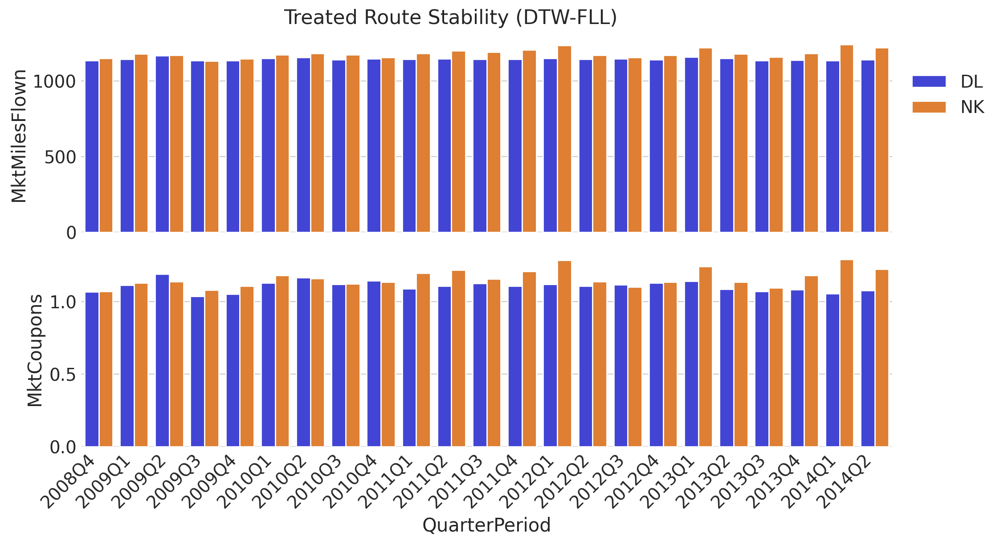

In [62]:
sns.set_style("whitegrid")

in_study_df = dtw_fll_df[dtw_fll_df['QuarterPeriod'] <= '2014Q2']

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 6), sharex=True)

sns.barplot(
    data=in_study_df,
    x='QuarterPeriod',
    y='MktMilesFlown',
    hue='RPCarrier',
    hue_order=['DL','NK'],
    errorbar=('ci', False),
    ax=ax[0]
)
sns.barplot(
    data=in_study_df,
    x='QuarterPeriod',
    y='MktCoupons',
    hue='RPCarrier',
    hue_order=['DL','NK'],
    errorbar=('ci', False),
    ax=ax[1]
)
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 0.9))
ax[0].get_legend().remove()
ax[1].get_legend().remove()
plt.xticks(rotation=45, ha='right')
fig.suptitle('Treated Route Stability (DTW-FLL)', fontsize=16)

save_path = os.path.join(plots_folder, 'Route_Stability.png')
plt.savefig(save_path, bbox_inches='tight')
plt.show()

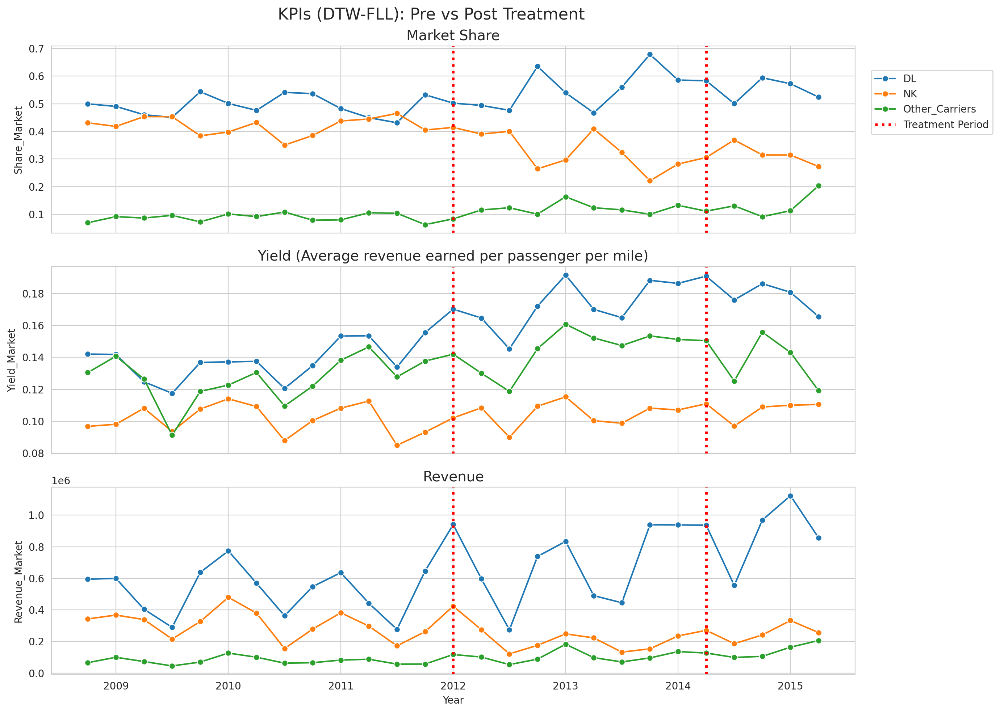

In [12]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(12, 10), sharex=True)

sns.lineplot(
    data=clean_quant_fll_df,
    x='Time_Numeric',
    y='Share_Market',
    hue='RPCarrier',
    hue_order=['DL', 'NK', 'Other_Carriers'],
    marker='o',
    ax=ax[0],
)
ax[0].set_title('Market Share', fontsize=14)

sns.lineplot(
    data=clean_quant_fll_df,
    x='Time_Numeric',
    y='Yield_Market',
    hue='RPCarrier',
    hue_order=['DL', 'NK', 'Other_Carriers'],
    marker='o',
    legend=False,
    ax=ax[1],
)
ax[1].set_title('Yield (Average revenue earned per passenger per mile)', fontsize=14)

sns.lineplot(
    data=clean_quant_fll_df,
    x='Time_Numeric',
    y='Revenue_Market',
    hue='RPCarrier',
    hue_order=['DL', 'NK', 'Other_Carriers'],
    marker='o',
    legend=False,
    ax=ax[2],
)
ax[2].set_title('Revenue', fontsize=14)
ax[2].set_xlabel('Year')

treatment_start_time = 2012
treatment_end_time = 2014.25
for a in ax:
    a.axvline(x=treatment_start_time, color='red', linestyle=':',
              linewidth=2.5, label='Treatment Period')
    a.axvline(x=treatment_end_time, color='red', linestyle=':',
              linewidth=2.5)

handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 0.9))
ax[0].get_legend().remove()
fig.suptitle('KPIs (DTW-FLL): Pre vs Post Treatment', fontsize=16)
plt.tight_layout()

save_path = os.path.join(plots_folder, 'KPIs_Before_After.png')
plt.savefig(save_path, bbox_inches='tight')
plt.show()

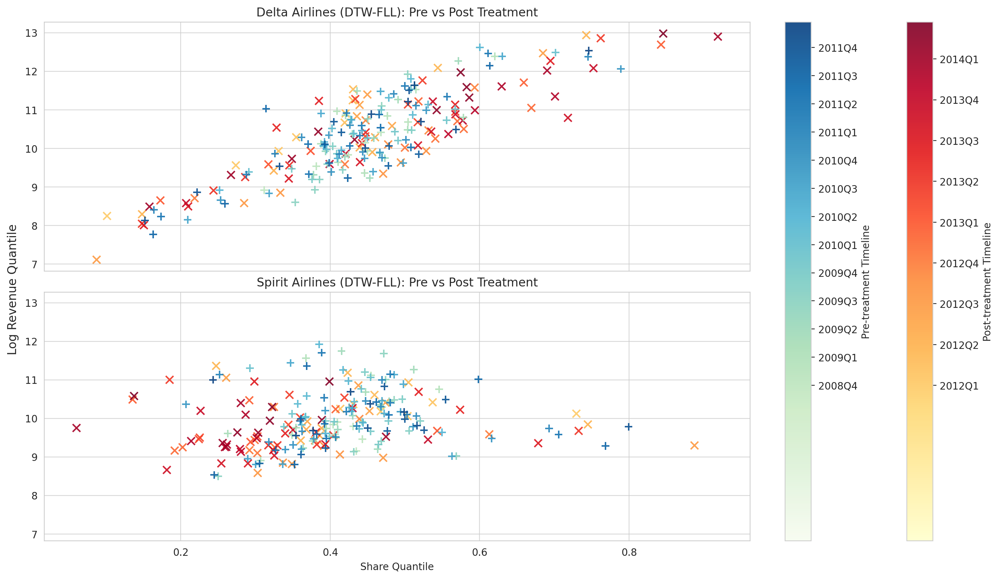

In [13]:
fig, ax = plt.subplots(
    2, 1,
    figsize=(14, 8),
    sharex=True,
    sharey=True,
    layout='constrained'
)

plot_market_evolution(
    ax[0],
    post_dl_fll_df,
    x_value='Share_Quantile',
    y_value='Revenue_Quantile_log',
    cmap_name='YlOrRd',
    label='Post',
    shape='x',
    draw_cbar=False
)
plot_market_evolution(
    ax[0],
    pre_dl_fll_df,
    'Share_Quantile',
    'Revenue_Quantile_log',
    'GnBu',
    'Pre',
    "+",
    draw_cbar=False
)

ax[0].set_title('Delta Airlines (DTW-FLL): Pre vs Post Treatment')
ax[0].grid(True, alpha=0.8)

sc_post, ticks_post, labels_post = plot_market_evolution(
    ax[1],
    post_nk_fll_df,
    'Share_Quantile',
    'Revenue_Quantile_log',
    'YlOrRd',
    'Post',
    'x',
    draw_cbar=False
)
sc_pre, ticks_pre, labels_pre = plot_market_evolution(
    ax[1],
    pre_nk_fll_df,
    'Share_Quantile',
    'Revenue_Quantile_log',
    'GnBu',
    'Pre',
    "+",
    draw_cbar=False
)

ax[1].set_title('Spirit Airlines (DTW-FLL): Pre vs Post Treatment')
ax[1].set_xlabel('Share Quantile')
ax[1].grid(True, alpha=0.8)
fig.supylabel('Log Revenue Quantile')

cb2 = fig.colorbar(sc_post, ax=ax[:,], ticks=ticks_post, location='right')
cb2.ax.set_yticklabels(labels_post)
cb2.set_label('Post-treatment Timeline')

cb1 = fig.colorbar(sc_pre, ax=ax[:,], ticks=ticks_pre, location='right')
cb1.ax.set_yticklabels(labels_pre)
cb1.set_label('Pre-treatment Timeline')

save_path = os.path.join(plots_folder, 'market_revenue_dynamics.png')
plt.savefig(save_path)
plt.show()

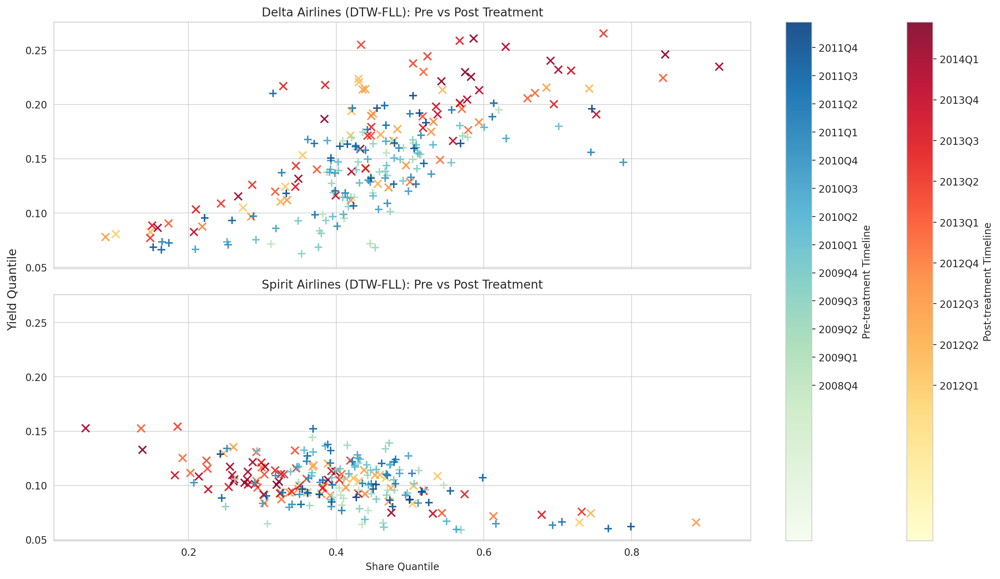

In [14]:
fig, ax = plt.subplots(
    2, 1,
    figsize=(14, 8),
    sharex=True,
    sharey=True,
    layout='constrained'
)

plot_market_evolution(
    ax[0],
    post_dl_fll_df,
    'Share_Quantile',
    'Yield_Quantile',
    'YlOrRd',
    'Post',
    'x',
    draw_cbar=False

)
plot_market_evolution(
    ax[0],
    pre_dl_fll_df,
    'Share_Quantile',
    'Yield_Quantile',
    'GnBu',
    'Pre',
    "+",
    draw_cbar=False
)

ax[0].set_title('Delta Airlines (DTW-FLL): Pre vs Post Treatment')
ax[0].grid(True, alpha=0.8)

sc_post, ticks_post, labels_post = plot_market_evolution(
    ax[1],
    post_nk_fll_df,
    'Share_Quantile',
    'Yield_Quantile',
    'YlOrRd',
    'Post',
    'x',
    draw_cbar=False
)
sc_pre, ticks_pre, labels_pre = plot_market_evolution(
    ax[1],
    pre_nk_fll_df,
    'Share_Quantile',
    'Yield_Quantile',
    'GnBu',
    'Pre',
    "+",
    draw_cbar=False
)

ax[1].set_title('Spirit Airlines (DTW-FLL): Pre vs Post Treatment')
ax[1].set_xlabel('Share Quantile')
ax[1].grid(True, alpha=0.8)
fig.supylabel('Yield Quantile')

cb2 = fig.colorbar(sc_post, ax=ax[:,], ticks=ticks_post, location='right')
cb2.ax.set_yticklabels(labels_post)
cb2.set_label('Post-treatment Timeline')

cb1 = fig.colorbar(sc_pre, ax=ax[:,], ticks=ticks_pre, location='right')
cb1.ax.set_yticklabels(labels_pre)
cb1.set_label('Pre-treatment Timeline')

save_path = os.path.join(plots_folder, 'market_yield_dynamics.png')
plt.savefig(save_path)
plt.show()

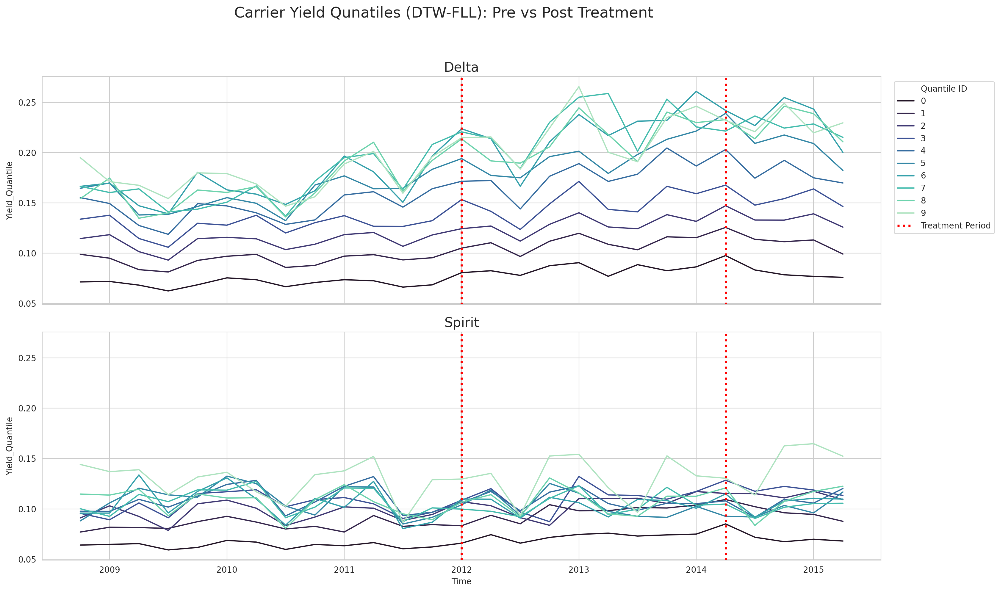

In [15]:
n_quantiles = agg_quantile_fll_df['Quantile_id'].nunique()
sequential_palette = sns.color_palette("mako", n_colors=n_quantiles)

fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 10), sharex=True, sharey=True)

sns.lineplot(
    data=dl_data,
    x='Time_Numeric',
    y='Yield_Quantile',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[0]
)
ax[0].set_title('Delta', fontsize=16)

sns.lineplot(
    data=nk_data,
    x='Time_Numeric',
    y='Yield_Quantile',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[1]
)
ax[1].set_title('Spirit', fontsize=16)
ax[1].set_xlabel('Time')

for a in ax:
    a.axvline(x=treatment_start_time, color='red', linestyle=':',
              linewidth=2.5, label='Treatment Period')
    a.axvline(x=treatment_end_time, color='red', linestyle=':',
              linewidth=2.5)

handles, labels = ax[1].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc='upper left',
    bbox_to_anchor=(1, 0.9),
    title='Quantile ID'
)

ax[0].get_legend().remove()
ax[1].get_legend().remove()

fig.suptitle('Carrier Yield Qunatiles (DTW-FLL): Pre vs Post Treatment', fontsize=18, y=1.02)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

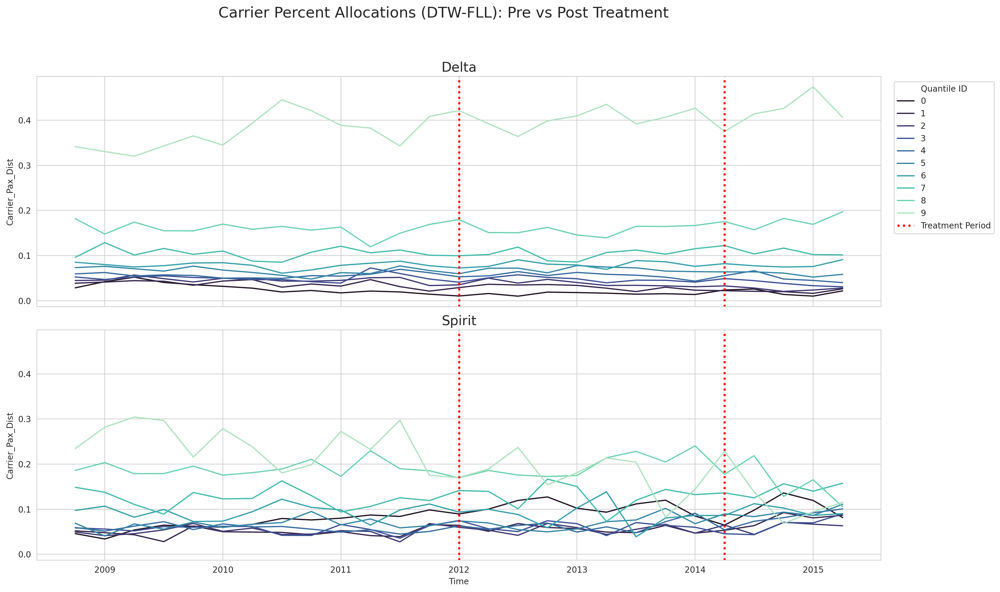

In [16]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 10), sharex=True, sharey=True)

sns.lineplot(
    data=dl_data,
    x='Time_Numeric',
    y='Carrier_Pax_Dist',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[0]
)
ax[0].set_title('Delta', fontsize=16)

sns.lineplot(
    data=nk_data,
    x='Time_Numeric',
    y='Carrier_Pax_Dist',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[1]
)
ax[1].set_title('Spirit', fontsize=16)
ax[1].set_xlabel('Time')

for a in ax:
    a.axvline(x=treatment_start_time, color='red', linestyle=':',
              linewidth=2.5, label='Treatment Period')
    a.axvline(x=treatment_end_time, color='red', linestyle=':',
              linewidth=2.5)

handles, labels = ax[1].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc='upper left',
    bbox_to_anchor=(1, 0.9),
    title='Quantile ID'
)

ax[0].get_legend().remove()
ax[1].get_legend().remove()

fig.suptitle('Carrier Percent Allocations (DTW-FLL): Pre vs Post Treatment', fontsize=18, y=1.02)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

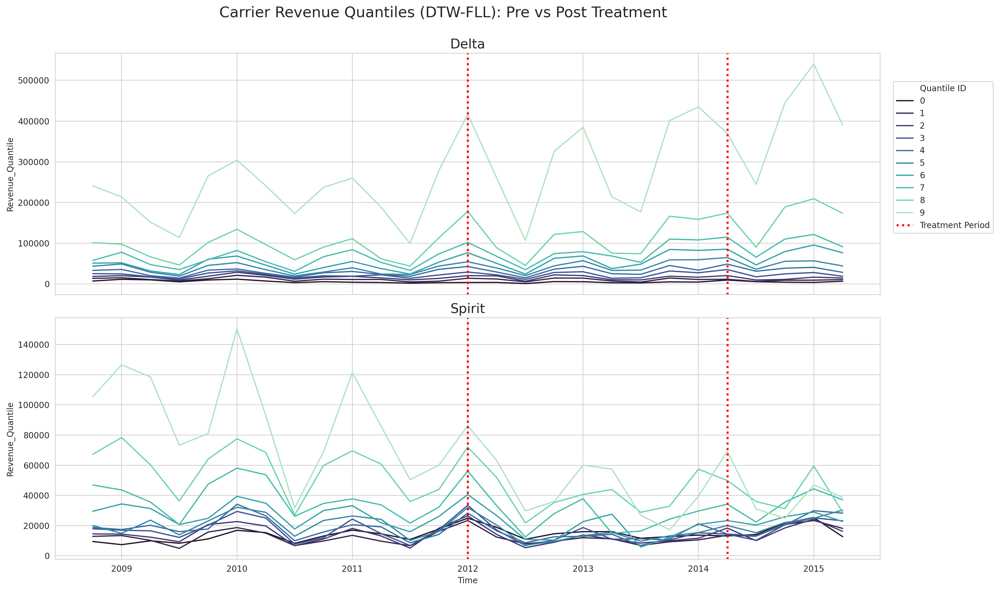

In [17]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(15, 10), sharex=True, sharey=False)

sns.lineplot(
    data=dl_data,
    x='Time_Numeric',
    y='Revenue_Quantile',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[0]
)
ax[0].set_title('Delta', fontsize=16)

sns.lineplot(
    data=nk_data,
    x='Time_Numeric',
    y='Revenue_Quantile',
    hue='Quantile_id',
    palette=sequential_palette,
    ax=ax[1]
)
ax[1].set_title('Spirit', fontsize=16)
ax[1].set_xlabel('Time')

for a in ax:
    a.axvline(x=treatment_start_time, color='red', linestyle=':',
              linewidth=2.5, label='Treatment Period')
    a.axvline(x=treatment_end_time, color='red', linestyle=':',
              linewidth=2.5)

handles, labels = ax[1].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    loc='upper left',
    bbox_to_anchor=(1, 0.9),
    title='Quantile ID'
)

ax[0].get_legend().remove()
ax[1].get_legend().remove()

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
fig.suptitle('Carrier Revenue Quantiles (DTW-FLL): Pre vs Post Treatment', fontsize=18, y=1.02)

save_path = os.path.join(plots_folder, 'Revenue_Quantile.png')
plt.savefig(save_path, bbox_inches='tight')
plt.show()

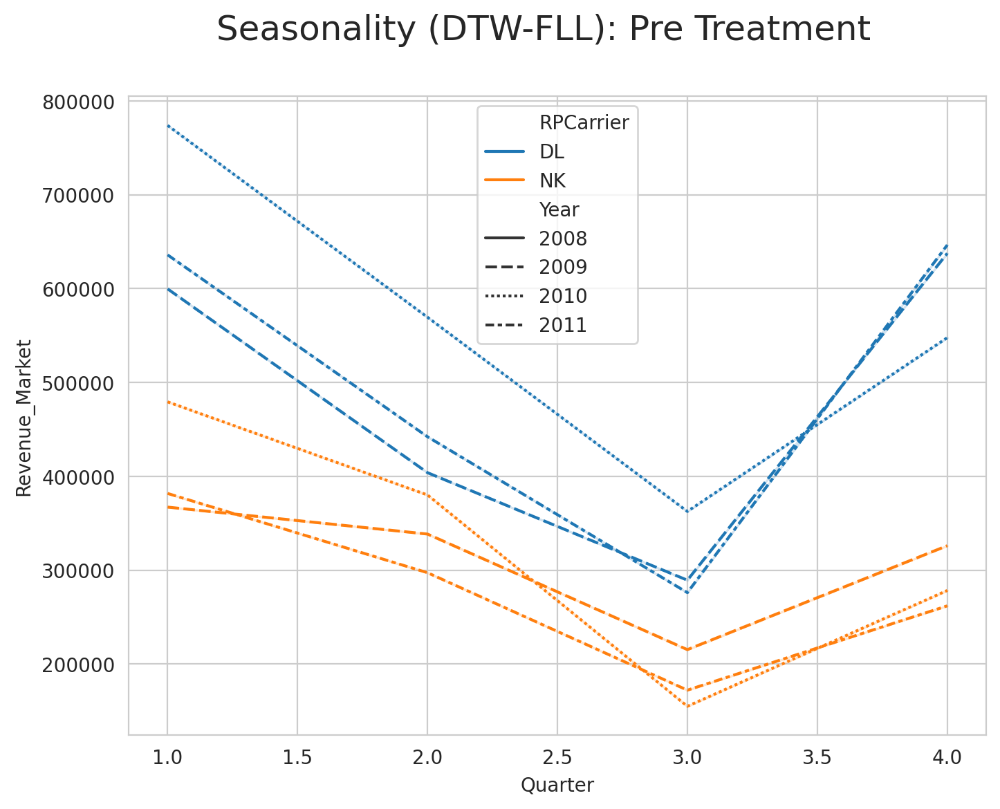

In [18]:
fig, ax = plt.subplots(figsize=(8, 6))

sns.lineplot(
    data=pre_fll_df,
    x='Quarter',
    y='Revenue_Market',
    style='Year',
    hue='RPCarrier',
    hue_order=['DL', 'NK'],
)
fig.suptitle('Seasonality (DTW-FLL): Pre Treatment', fontsize=18)
save_path = os.path.join(plots_folder, 'Seasonality.png')
plt.savefig(save_path, bbox_inches='tight')
plt.show()

## Modeling


### Delta Revenue Model

In [64]:
az.style.use("arviz-darkgrid")

In [20]:
dl_model = build_log_bsts_model(pre_dl_fll_df)

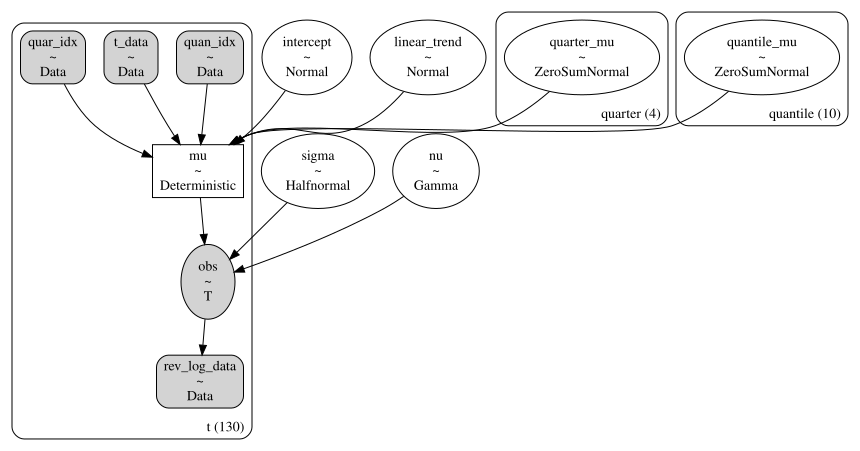

In [21]:
pm.model_to_graphviz(dl_model)

In [22]:
dl_model = build_log_bsts_model(pre_dl_fll_df)

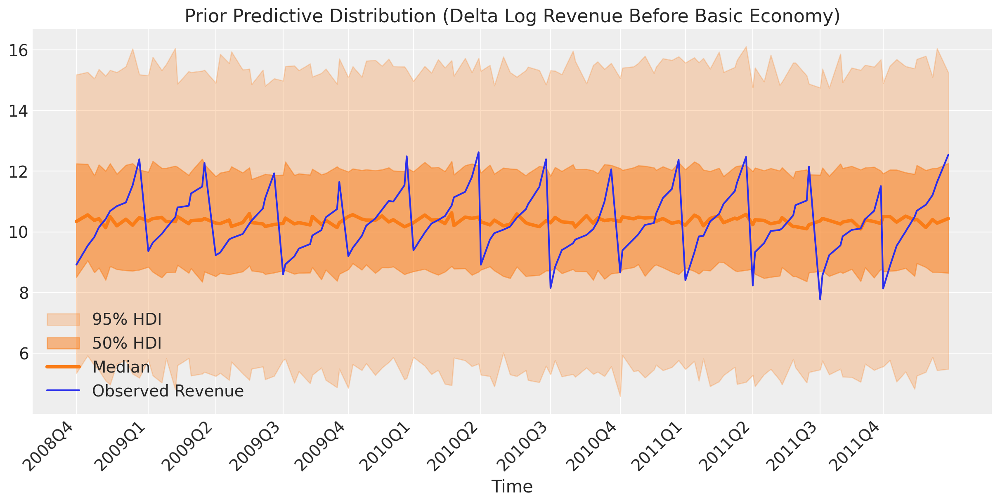

In [23]:
pre_time_str = pre_dl_fll_df['Time_Str']
pre_time_idx = pre_dl_fll_df.index.values

with dl_model:
    dl_idata = pm.sample_prior_predictive(random_seed=RANDOM_SEED)

fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(pre_time_str, pre_time_idx, dl_idata.prior_predictive["obs"], ax)

ax.plot(pre_dl_fll_df.index.values, pre_dl_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Prior Predictive Distribution (Delta Log Revenue Before Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'Prior_Predictive_DL.png')
plt.savefig(save_path)
plt.show()

The distribution of the models’ observations is centered on the actual observations but has more spread. This is useful because we know the priors are not too restrictive and are unlikely to systematically bias our posterior predictions upward or downward.

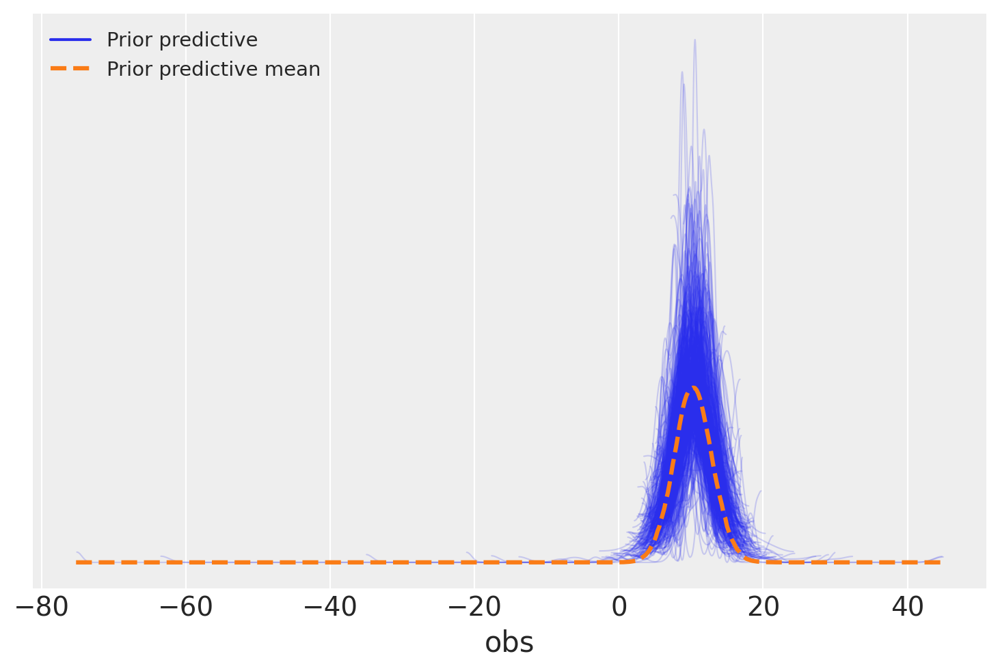

In [24]:
az.plot_ppc(dl_idata, group="prior");

In [25]:
with dl_model:
    dl_idata.extend(pm.sample(random_seed=RANDOM_SEED, target_accept=.90))

Output()

In [26]:
az.summary(
    dl_idata,
    var_names=[
        'intercept',
        'linear_trend',
        'quarter_mu',
        'quantile_mu',
        'sigma'
    ]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,10.324,0.018,10.290,10.358,0.000,0.000,4371.0,3389.0,1.0
linear_trend,-0.035,0.019,-0.071,0.001,0.000,0.000,3545.0,2985.0,1.0
quarter_mu[0],0.316,0.033,0.256,0.379,0.000,0.000,4665.0,3194.0,1.0
quarter_mu[1],-0.017,0.032,-0.081,0.042,0.000,0.001,4992.0,3013.0,1.0
quarter_mu[2],-0.463,0.032,-0.525,-0.404,0.000,0.001,4916.0,3192.0,1.0
quarter_mu[3],0.164,0.029,0.113,0.220,0.000,0.000,5479.0,2931.0,1.0
quantile_mu[0],-1.609,0.073,-1.745,-1.471,0.001,0.001,3082.0,2670.0,1.0
quantile_mu[1],-1.034,0.055,-1.139,-0.933,0.001,0.001,6220.0,2985.0,1.0
quantile_mu[2],-0.632,0.054,-0.733,-0.530,0.001,0.001,5042.0,3183.0,1.0
quantile_mu[3],-0.394,0.051,-0.491,-0.297,0.001,0.001,5575.0,3232.0,1.0


<Axes: >

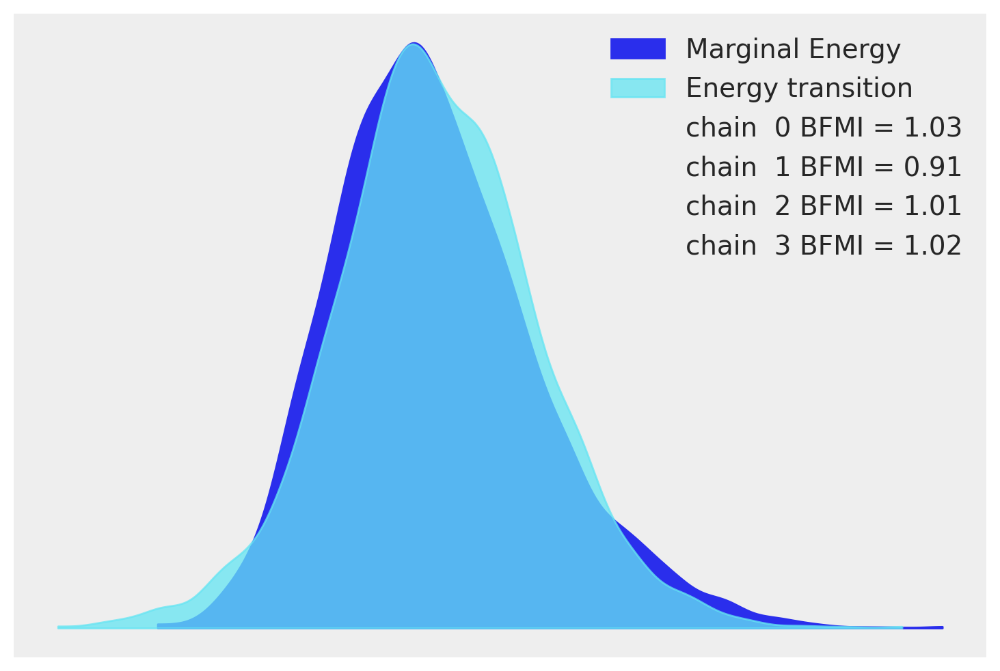

In [27]:
az.plot_energy(dl_idata)

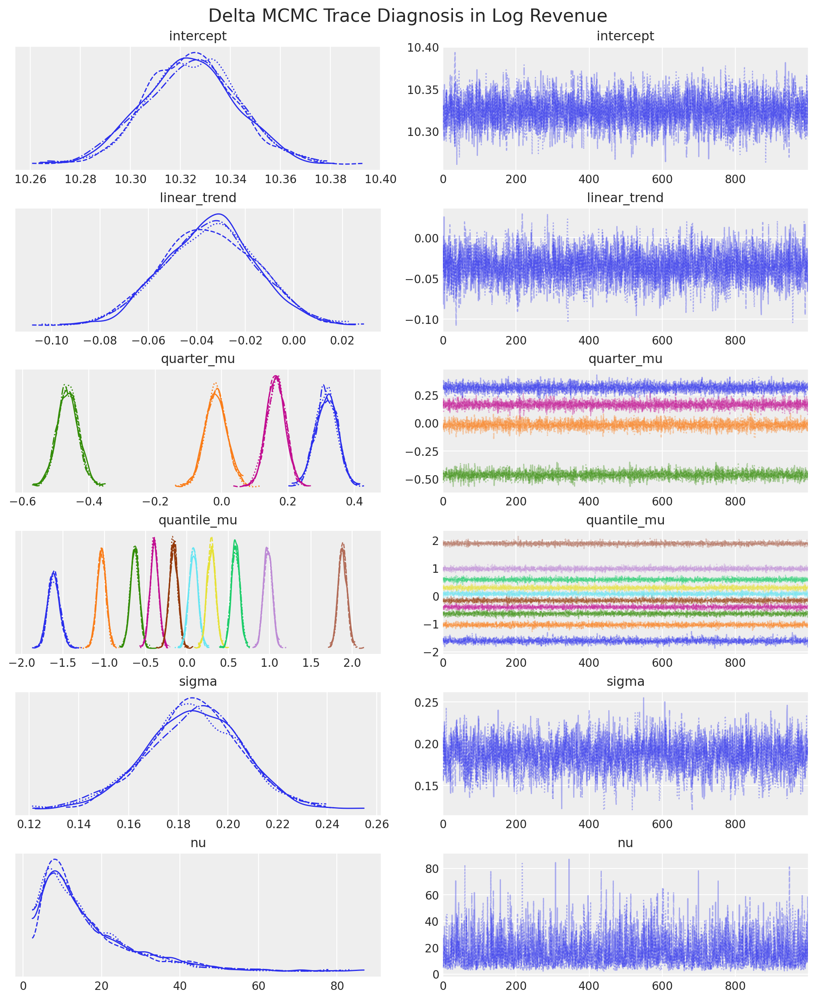

In [28]:
plot_vars = [
    'intercept',
    'linear_trend',
    'quarter_mu',
    'quantile_mu',
    'sigma',
    'nu'
]

axes = az.plot_trace(
    dl_idata,
    var_names=plot_vars,
    compact=True,
    figsize=(10, 12)
)

plt.suptitle("Delta MCMC Trace Diagnosis in Log Revenue", fontsize=16, y=1.02)

save_path = os.path.join(plots_folder, 'dl_MCMC_trace.png')
plt.savefig(save_path, bbox_inches='tight')

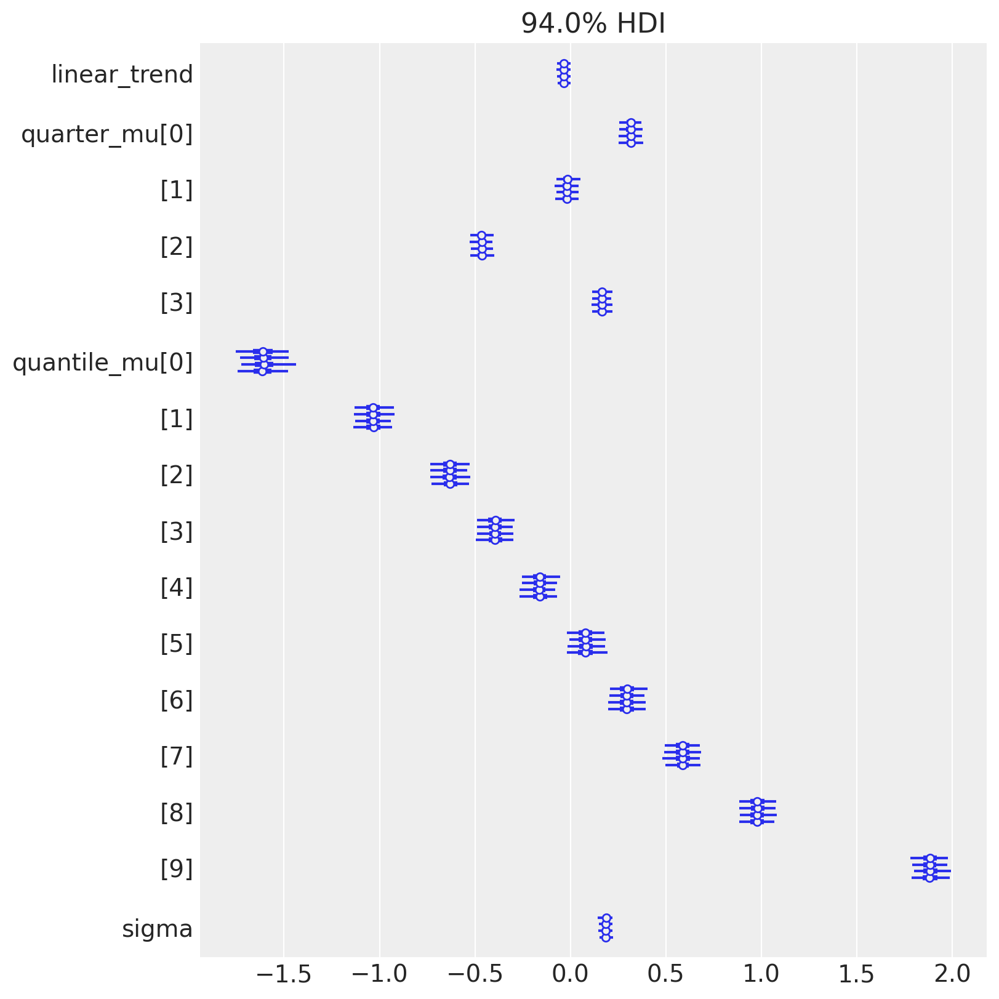

In [29]:
az.plot_forest(
    dl_idata.posterior,
    var_names=[
               'linear_trend',
               'quarter_mu',
               'quantile_mu',
               'sigma',
    ],
    figsize=(8,8));

Output()

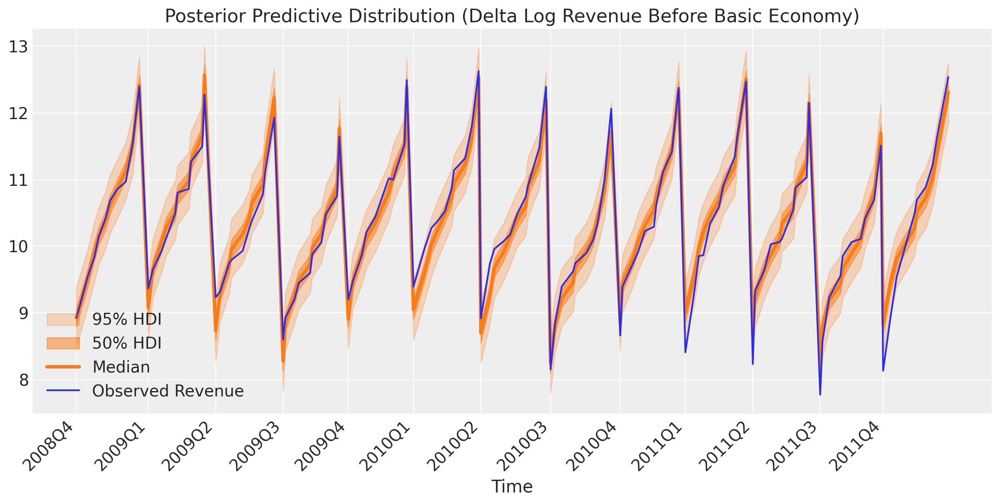

In [30]:
with dl_model:
    dl_idata.extend(pm.sample_posterior_predictive(dl_idata, random_seed=RANDOM_SEED))

fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(pre_time_str, pre_time_idx, dl_idata.posterior_predictive['obs'], ax)

ax.plot(pre_time_idx, pre_dl_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Posterior Predictive Distribution (Delta Log Revenue Before Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'Pretreatment_Posterior_Predictive_DL.png')
plt.savefig(save_path)
plt.show()

In [31]:
post_dl_quarter_idx = post_dl_fll_df['Quarter_id'].values
post_dl_quantile_idx = post_dl_fll_df['Quantile_id'].values

post_time = post_dl_fll_df['Time_Numeric'].index.values
pre_time_mean = pre_time_idx.mean()
pre_time_std = pre_time_idx.std()

post_time_str = post_dl_fll_df['Time_Str']
post_time_scaled = (post_time - pre_time_mean) / pre_time_std

In [32]:
with dl_model:
    pm.set_data(
        {
            't_data': post_time_scaled,
            'quar_idx': post_dl_quarter_idx,
            'quan_idx': post_dl_quantile_idx,
        }
    )
    counterfactual = pm.sample_posterior_predictive(
        dl_idata, var_names=['obs'], random_seed=RANDOM_SEED
    )

Output()

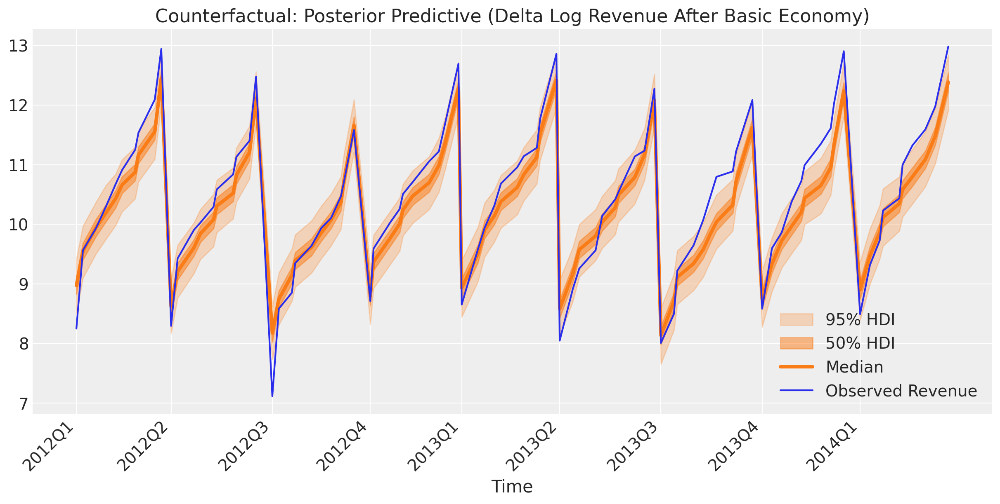

In [33]:
fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(
    post_time_str,
    post_time_scaled,
    counterfactual.posterior_predictive["obs"],
    ax,
)

ax.plot(post_time_scaled, post_dl_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Counterfactual: Posterior Predictive (Delta Log Revenue After Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'log_Counterfactual_Posterior_Predictive_DL.png')
plt.savefig(save_path)

plt.show()

For the previous plots, it makes sense to keep things on the log scale so the distributions are clearer. Here, we convert log revenue back into dollars for better interpretability.

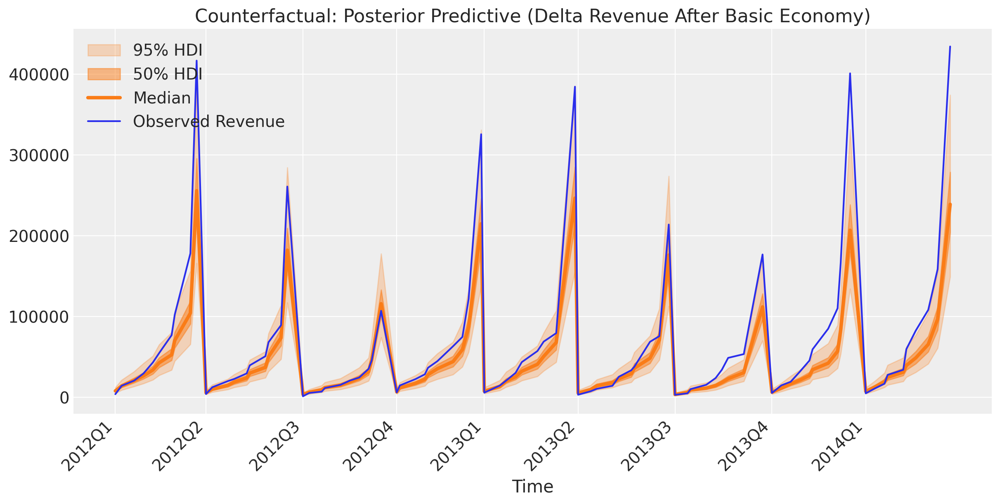

In [34]:
fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(
    post_time_str,
    post_time_scaled,
    np.exp(counterfactual.posterior_predictive["obs"]),
    ax,
)

ax.plot(post_time_scaled, post_dl_fll_df["Revenue_Quantile"], label="Observed Revenue")
ax.set(title="Counterfactual: Posterior Predictive (Delta Revenue After Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'Counterfactual_Posterior_Predictive_DL.png')
plt.savefig(save_path)

plt.show()

In [35]:
dl_revenue_dollar= xr.DataArray(
     post_dl_fll_df["Revenue_Quantile"].to_numpy(),
     dims=["t"]
)
dl_counterfactual_revenue_dollar = np.exp(counterfactual.posterior_predictive["obs"])
dl_diff_q_revenue = dl_revenue_dollar - dl_counterfactual_revenue_dollar
dl_cumsum = dl_diff_q_revenue.cumsum(dim="t")


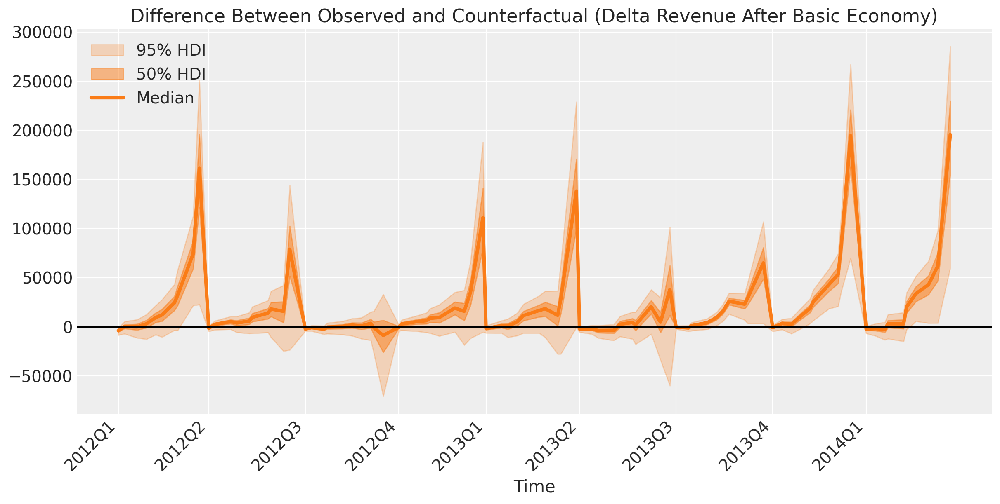

In [65]:
fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(
    post_time_str,
    post_time,
    dl_diff_q_revenue.transpose(..., "t"),
    ax,
)

ax.axhline(y=0, color="k")
ax.set(title="Difference Between Observed and Counterfactual (Delta Revenue After Basic Economy)")
plt.legend()

save_path = os.path.join(plots_folder, 'Revenue_Diff_DL.png')
plt.savefig(save_path)
plt.show()

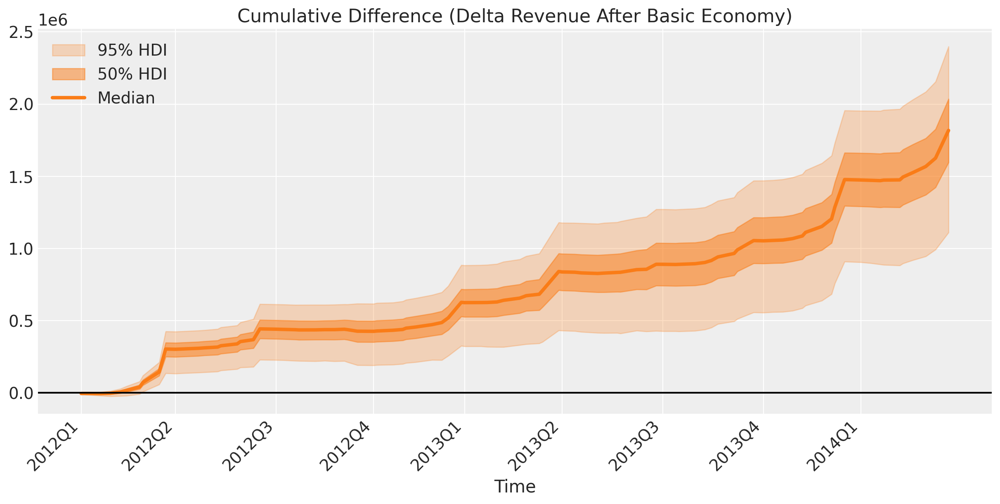

In [37]:
fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(
    post_time_str,
    post_time,
    dl_cumsum.transpose(..., "t"),
    ax,
)

ax.axhline(y=0, color="k")
ax.set(title="Cumulative Difference (Delta Revenue After Basic Economy)")
plt.legend()

save_path = os.path.join(plots_folder, 'Cumulative_Revenue_DL.png')
plt.savefig(save_path)
plt.show()

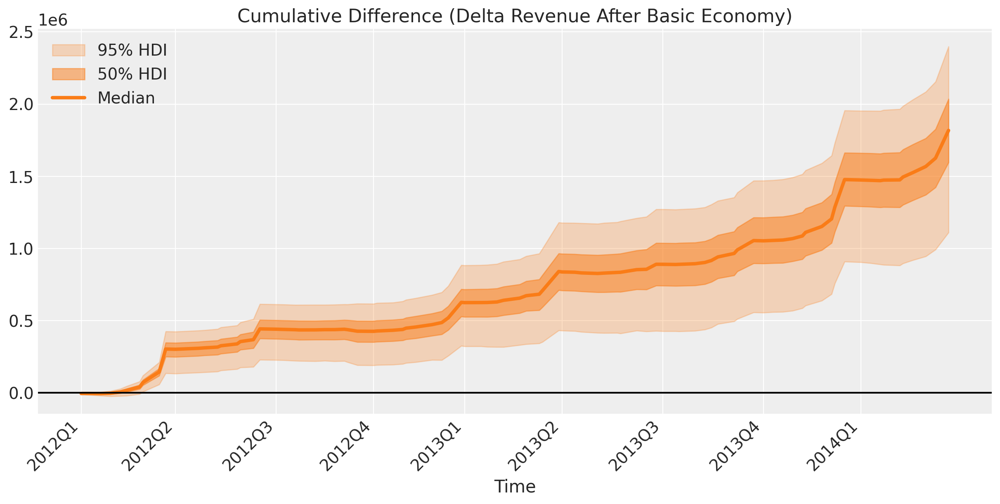

In [38]:
fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(
    post_time_str,
    post_time,
    dl_cumsum.transpose(..., "t"),
    ax,
)

ax.axhline(y=0, color="k")
ax.set(title="Cumulative Difference (Delta Revenue After Basic Economy)")
plt.legend()

save_path = os.path.join(plots_folder, 'Cumulative_Revenue_DL.png')
plt.savefig(save_path)
plt.show()

### Spirit Revenue Model

In [39]:
nk_model = build_log_bsts_model(pre_nk_fll_df)

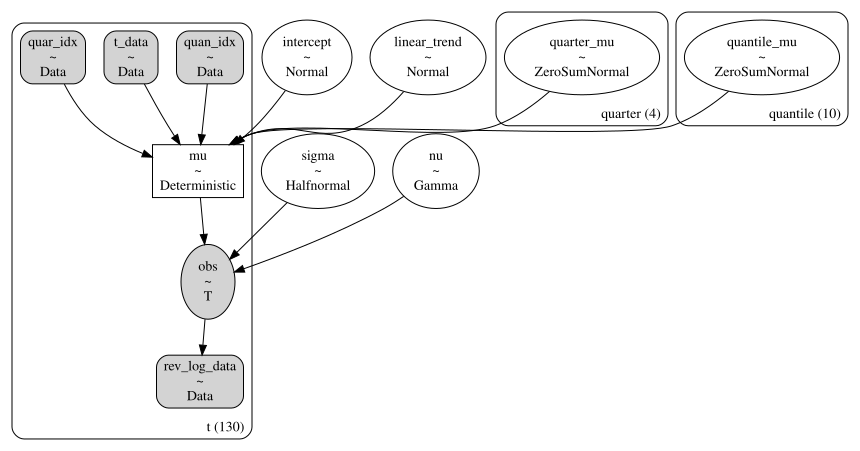

In [40]:
pm.model_to_graphviz(nk_model)

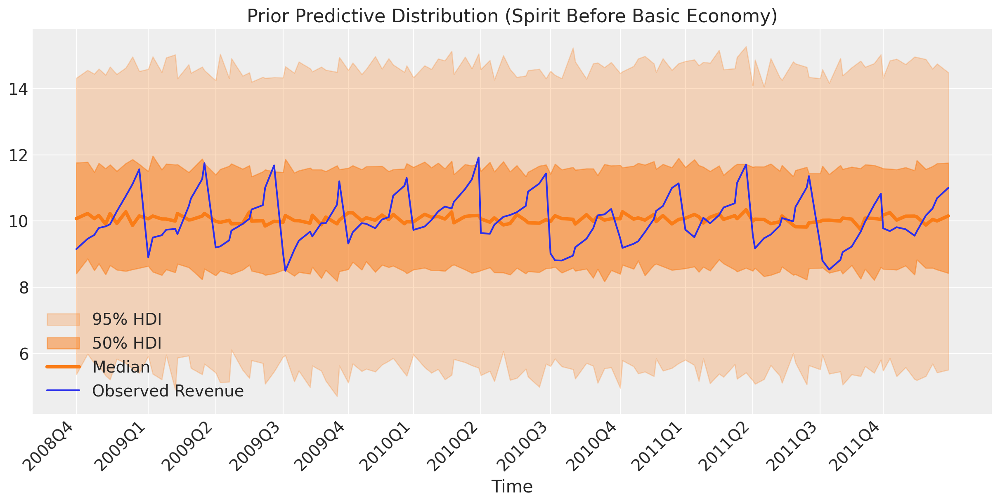

In [41]:
with nk_model:
    nk_idata = pm.sample_prior_predictive(random_seed=RANDOM_SEED)

fig, ax = plt.subplots(
    figsize=(12, 6),
)

plot_xY(pre_time_str, pre_time_idx, nk_idata.prior_predictive["obs"], ax)

ax.plot(pre_time_idx, pre_nk_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Prior Predictive Distribution (Spirit Before Basic Economy)")
ax.legend();

In [42]:
with nk_model:
    nk_idata.extend(pm.sample(random_seed=RANDOM_SEED))

Output()

In [43]:
az.summary(
    nk_idata,
    var_names=[
        'intercept',
        'linear_trend',
        'quarter_mu',
        'quantile_mu',
        'sigma'
    ]
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,10.041,0.020,10.005,10.080,0.000,0.000,7610.0,2552.0,1.0
linear_trend,-0.032,0.019,-0.068,0.004,0.000,0.000,7065.0,3135.0,1.0
quarter_mu[0],0.292,0.037,0.226,0.362,0.000,0.001,8257.0,3234.0,1.0
quarter_mu[1],0.136,0.035,0.071,0.202,0.000,0.001,8481.0,3293.0,1.0
quarter_mu[2],-0.482,0.036,-0.551,-0.413,0.000,0.001,7898.0,2951.0,1.0
quarter_mu[3],0.054,0.032,-0.005,0.115,0.000,0.001,7898.0,3237.0,1.0
quantile_mu[0],-0.644,0.063,-0.759,-0.524,0.001,0.001,7578.0,3344.0,1.0
quantile_mu[1],-0.742,0.059,-0.857,-0.637,0.001,0.001,8811.0,2829.0,1.0
quantile_mu[2],-0.561,0.062,-0.678,-0.446,0.001,0.001,8671.0,3190.0,1.0
quantile_mu[3],-0.385,0.060,-0.502,-0.277,0.001,0.001,8967.0,2950.0,1.0


<Axes: >

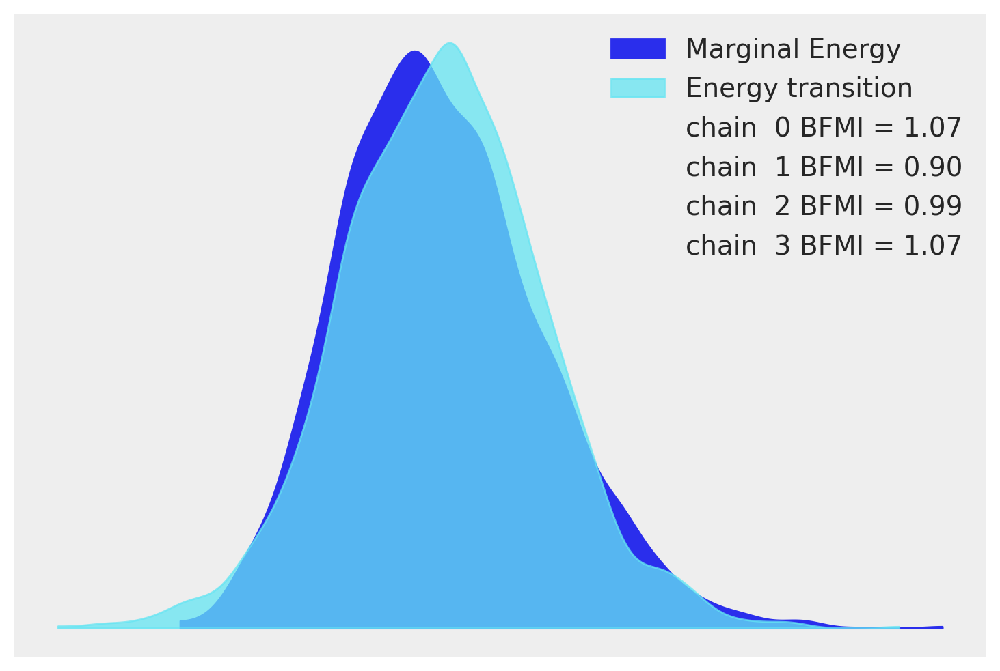

In [44]:
az.plot_energy(nk_idata)

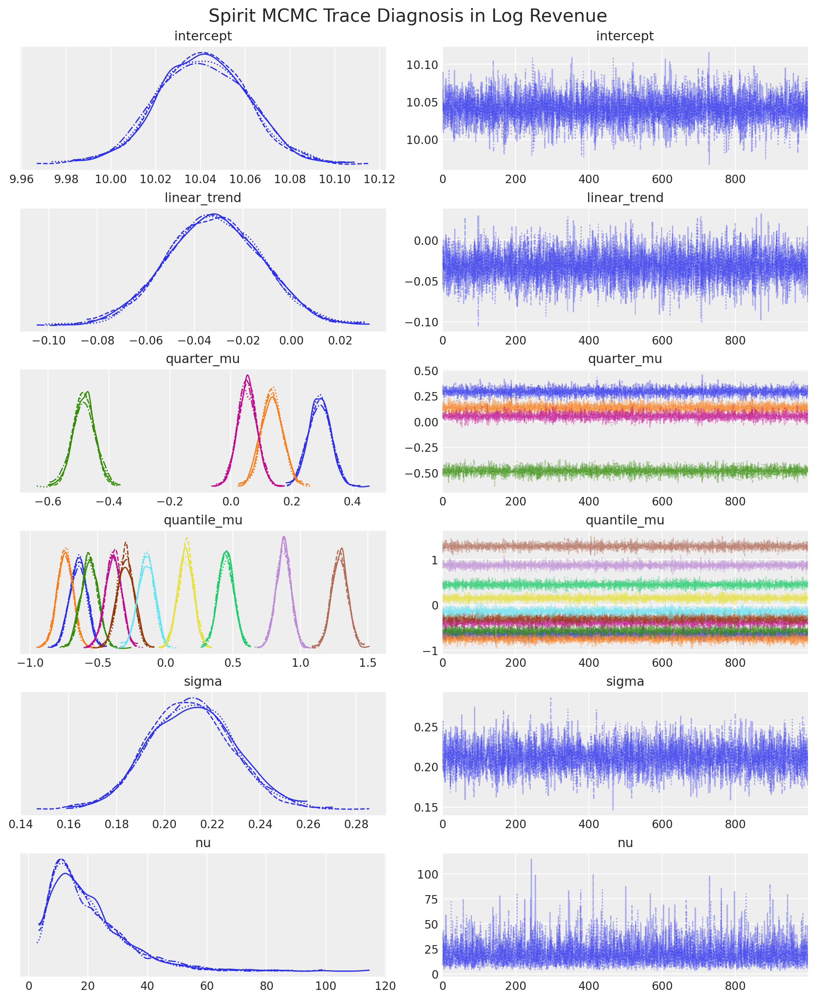

In [45]:
plot_vars = [
    'intercept',
    'linear_trend',
    'quarter_mu',
    'quantile_mu',
    'sigma',
    'nu'
]

axes = az.plot_trace(
    nk_idata,
    var_names=plot_vars,
    compact=True,
    figsize=(10, 12)
)

plt.suptitle("Spirit MCMC Trace Diagnosis in Log Revenue", fontsize=16, y=1.02)

save_path = os.path.join(plots_folder, 'nk_MCMC_trace.png')
plt.savefig(save_path, bbox_inches='tight')

Output()

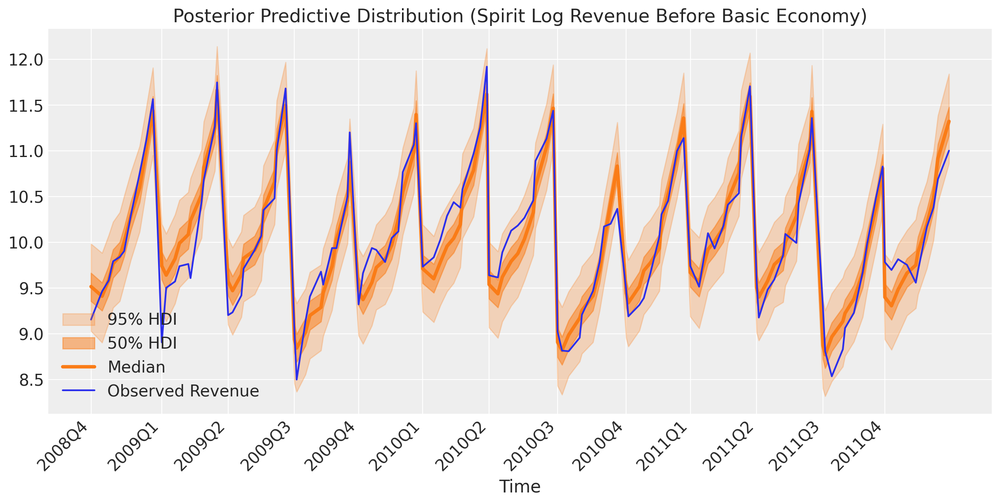

In [46]:
with nk_model:
    nk_idata.extend(pm.sample_posterior_predictive(nk_idata, random_seed=RANDOM_SEED))


fig, ax = plt.subplots(figsize=(12, 6))

plot_xY(
    pre_time_str,
    pre_time_idx,
    nk_idata.posterior_predictive["obs"],
    ax
)

ax.plot(pre_time_idx, pre_nk_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Posterior Predictive Distribution (Spirit Log Revenue Before Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'Pretreatment_Posterior_Predictive_NK.png')
plt.savefig(save_path)

In [47]:
post_nk_quarter_idx = post_nk_fll_df['Quarter_id'].values
post_nk_quantile_idx = post_nk_fll_df['Quantile_id'].values

In [48]:
with nk_model:
    pm.set_data(
        {
            't_data': post_time_scaled,
            'quar_idx': post_nk_quarter_idx,
            'quan_idx': post_nk_quantile_idx,
        }
    )
    counterfactual = pm.sample_posterior_predictive(
        nk_idata, var_names=['obs'], random_seed=RANDOM_SEED
    )

Output()

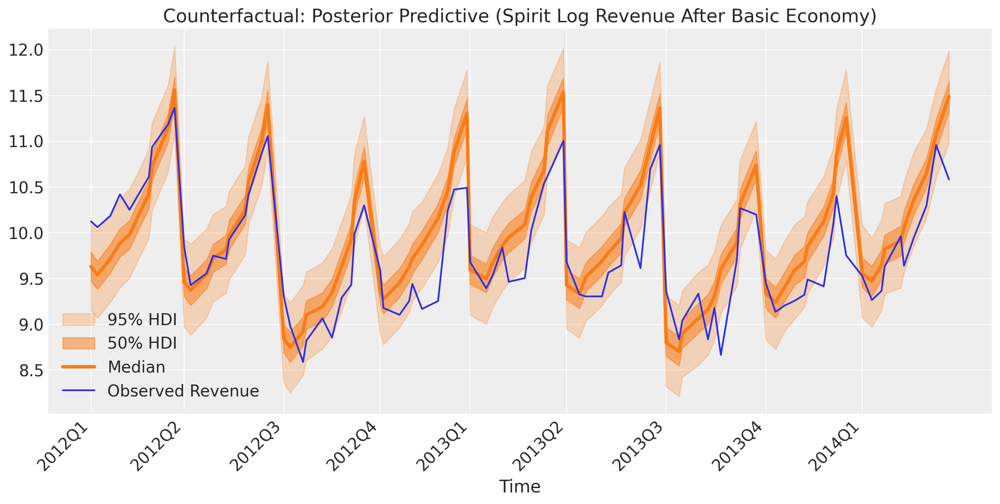

In [49]:
fig, ax = plt.subplots(figsize=(12, 6))

plot_xY(
    post_time_str,
    post_time_scaled,
    counterfactual.posterior_predictive["obs"],
    ax,
)

ax.plot(post_time_scaled, post_nk_fll_df["Revenue_Quantile_log"], label="Observed Revenue")
ax.set(title="Counterfactual: Posterior Predictive (Spirit Log Revenue After Basic Economy)")
ax.legend()

save_path = os.path.join(plots_folder, 'Counterfactual_Posterior_Predictive_NK.png')
plt.savefig(save_path)

In [50]:
nk_revenue_dollar= xr.DataArray(
     post_nk_fll_df["Revenue_Quantile"].to_numpy(),
     dims=["t"]
)
nk_counterfactual_revenue_dollar = np.exp(counterfactual.posterior_predictive["obs"])

nk_diff_q_revenue = nk_revenue_dollar - nk_counterfactual_revenue_dollar

nk_cumsum = nk_diff_q_revenue.cumsum(dim="t")

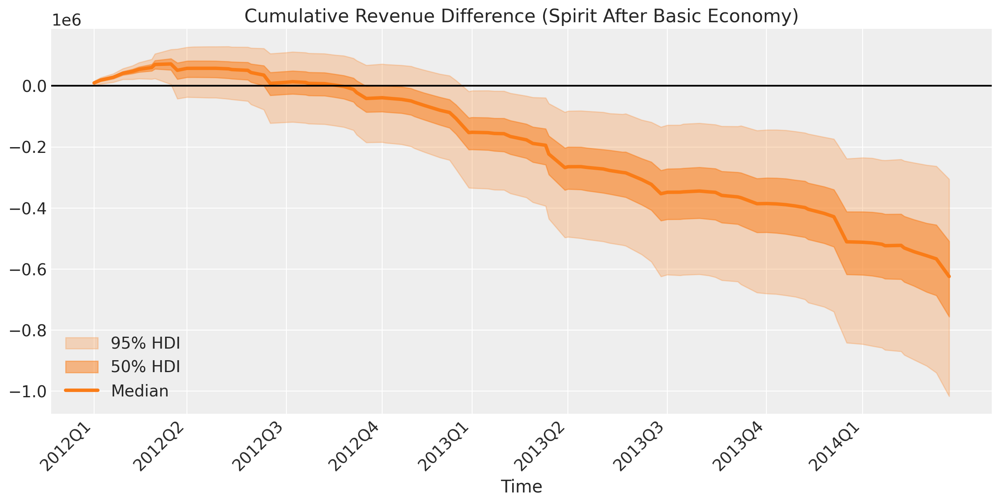

In [52]:
fig, ax = plt.subplots(figsize=(12, 6))

plot_xY(
    post_time_str,
    post_time,
    nk_cumsum.transpose(..., "t"),
    ax,
)

ax.axhline(y=0, color="k")
ax.set(title="Cumulative Revenue Difference (Spirit After Basic Economy)")
ax.legend()
save_path = os.path.join(plots_folder, 'Cumulative_Revenue_NK.png')
plt.savefig(save_path)

In [54]:
summarize_causal_effect(dl_diff_q_revenue, dl_cumsum, airline_name="Delta")

summarize_causal_effect(nk_diff_q_revenue, nk_cumsum, airline_name="Spirit")

--- Delta Causal Impact Summary ---
Average Quarterly Lift (Total): 200,494
  94% HDI: [135,263, 270,144]
  (Average Lift per Quantile: 20,049)
Total Cumulative Revenue Impact: 1,804,445
  94% HDI: [1,217,369, 2,431,293]
Probability of Positive Impact: 100.0%
-----------------------------------
--- Spirit Causal Impact Summary ---
Average Quarterly Lift (Total): -70,761
  94% HDI: [-109,817, -34,193]
  (Average Lift per Quantile: -7,076)
Total Cumulative Revenue Impact: -636,853
  94% HDI: [-988,357, -307,741]
Probability of Positive Impact: 0.0%
-----------------------------------


Save models

In [55]:
nk_idata.to_netcdf("/content/drive/MyDrive/AirlineData/counterfactual_trend_models/trend_nk_model.nc")

'/content/drive/MyDrive/AirlineData/counterfactual_trend_models/trend_nk_model.nc'

In [56]:
dl_idata.to_netcdf("/content/drive/MyDrive/AirlineData/counterfactual_trend_models/trend_dl_model.nc")

'/content/drive/MyDrive/AirlineData/counterfactual_trend_models/trend_dl_model.nc'

In [57]:
dl_model_graph = pm.model_to_graphviz(dl_model)
dl_model_graph.render(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_models/dl_model_graph', format='png', view=False)

'/content/drive/MyDrive/AirlineData/counterfactual_trend_models/dl_model_graph.png'

In [58]:
nk_model_graph = pm.model_to_graphviz(nk_model)
nk_model_graph.render(filename='/content/drive/MyDrive/AirlineData/counterfactual_trend_models/nk_model_graph', format='png', view=False)

'/content/drive/MyDrive/AirlineData/counterfactual_trend_models/nk_model_graph.png'